

<div style="border-radius:20px;
            border : black solid;
            background-color: ##FFFFFF;
            font-size:200%;
            text-align: left">

<h1 style='; border:0; border-radius: 15px; text-shadow: 1px 1px black; font-weight: bold; color:green'><center> TITANIC </center></h1>

![](https://blog.aspiresys.pl/wp-content/uploads/2020/11/Blog-2.3.jpg)

# **INDEX**
- [Importing necessary libraries](#import)
- [Importing the data](#data)
- [Explore Data Analysis(EDA)](#eda)
    - [Null value](#null)
    - [Missing values percentage](#miss)
    -[Comparision with survived](#com)
    - [Data Visualization](#vis)
        - [Distribution of age](#age)
        - [Distribution of fare](#far)
        - [Relation of various with survived](#rel)
    - [Auto Visualization](#auto) 
    - [Data Pre-processing](#pro)
- [Model creation and evaluation](#model)
    - [Decision tree classifier](#dtc)
    - [Random forest classifier](#rfc)
    - [k nearst neighbour classifier](#knn)
    - [Support Vector Machine](#svm)
- [Submission file](#sv)

<div style="border-radius:10px;
            border : black solid;
            background-color:  #FFA07A;
            font-size:110%;
            text-align: left">

<h2 style='; border:0; border-radius: 15px; text-shadow: 1px 1px black; font-weight: bold; color:black'><center> PROBLEM STATMENT </center></h2>


The sinking of the Titanic is one of the most infamous shipwrecks in history.

On April 15, 1912, during her maiden voyage, the widely considered “unsinkable” RMS Titanic sank after colliding with an iceberg. Unfortunately, there weren’t enough lifeboats for everyone onboard, resulting in the death of 1502 out of 2224 passengers and crew.

While there was some element of luck involved in surviving, it seems some groups of people were more likely to survive than others.

In this challenge, we ask you to build a predictive model that answers the question: “what sorts of people were more likely to survive?” using passenger data (ie name, age, gender, socio-economic class, etc).

<div style="border-radius:10px;
            border : black solid;
            background-color:  #FFA07A;
            font-size:110%;
            text-align: left">
    <h2 style='; border:0; border-radius: 15px; text-shadow: 1px 1px black; font-weight: bold; color:black'><center> Importing relevant Libraries </center></h2><a id="import"></a>




![](https://d6vdma9166ldh.cloudfront.net/media/images/6c4b5480-62b9-4c00-a55b-7ddb3ef8c0f7.jpg)

In [1]:
# For data manipulation and visualization
import numpy as np
import pandas as pd
# import pandas_profiling
import matplotlib.pyplot as plt
import seaborn as sns

# For predictive data analysis
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, accuracy_score, precision_recall_curve 

<div style="border-radius:10px;
            border : black solid;
            background-color:  #FFA07A;
            font-size:110%;
            text-align: left">
    <h2 style='; border:0; border-radius: 15px; text-shadow: 1px 1px black; font-weight: bold; color:black'><center> Loading Train and Test Datasets </center></h2><a id="data"></a>



In [2]:
train = pd.read_csv(r"../input/titanic/train.csv")


In [3]:
test = pd.read_csv(r"../input/titanic/test.csv")


In [4]:
train.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [5]:
train.tail()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.00,NaN,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.00,B42,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.45,NaN,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.00,C148,C
890,891,0,3,"Dooley, Mr. Patrick",male,32.0,0,0,370376,7.75,NaN,Q


<div style="border-radius:10px;
            border : black solid;
            background-color:  #FFA07A;
            font-size:110%;
            text-align: left">
    <h2 style='; border:0; border-radius: 15px; text-shadow: 1px 1px black; font-weight: bold; color:black'><center> Explore Data Analysis(EDA) </center></h2><a id="eda"></a>



![](https://aienetcomclub.com/wp-content/uploads/2021/11/Untitled-1500-x-500-px-1024x341.png)

In [6]:
train.shape

(891, 12)

In [7]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


features are available in the dataset

In [8]:
train.columns

Index(['PassengerId', 'Survived', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp',
       'Parch', 'Ticket', 'Fare', 'Cabin', 'Embarked'],
      dtype='object')

In [9]:
train.describe().T.style.set_properties(**{'background-color': 'grey','color': 'white','border-color': 'white'})

,count,mean,std,min,25%,50%,75%,max
PassengerId,891.000000,446.000000,257.353842,1.000000,223.500000,446.000000,668.500000,891.000000
Survived,891.000000,0.383838,0.486592,0.000000,0.000000,0.000000,1.000000,1.000000
Pclass,891.000000,2.308642,0.836071,1.000000,2.000000,3.000000,3.000000,3.000000
Age,714.000000,29.699118,14.526497,0.420000,20.125000,28.000000,38.000000,80.000000
SibSp,891.000000,0.523008,1.102743,0.000000,0.000000,0.000000,1.000000,8.000000
Parch,891.000000,0.381594,0.806057,0.000000,0.000000,0.000000,0.000000,6.000000
Fare,891.000000,32.204208,49.693429,0.000000,7.910400,14.454200,31.000000,512.329200


**Check for duplicate rows and delete**

In [10]:
train.duplicated().sum()

0

**Null value**<a id="null"></a>

In [11]:
test.isna().sum()

PassengerId      0
Pclass           0
Name             0
Sex              0
Age             86
SibSp            0
Parch            0
Ticket           0
Fare             1
Cabin          327
Embarked         0
dtype: int64

In [12]:
train.isna().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

**Missing value filling** <a id="miss"></a>

In [13]:
def missing (train):
    missing_number = train.isnull().sum().sort_values(ascending=False)
    missing_percent = ((train.isnull().sum()/train.isnull().count())*100).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values

In [14]:
missing (train)

,Missing_Number,Missing_Percent
Cabin,687,77.104377
Age,177,19.865320
Embarked,2,0.224467
PassengerId,0,0.000000
Survived,0,0.000000
Pclass,0,0.000000
Name,0,0.000000
Sex,0,0.000000
SibSp,0,0.000000
Parch,0,0.000000


In [15]:
missing(test)

,Missing_Number,Missing_Percent
Cabin,327,78.229665
Age,86,20.574163
Fare,1,0.239234
PassengerId,0,0.000000
Pclass,0,0.000000
Name,0,0.000000
Sex,0,0.000000
SibSp,0,0.000000
Parch,0,0.000000
Ticket,0,0.000000


In [16]:
#fill null values with mean,median ,mode
for i in train.columns:
    if train[i].dtypes == 'object':
        train[i].fillna(train[i].mode()[0], inplace=True)
    else:
        train[i].fillna(train[i].median(), inplace=True)
print(train)

     PassengerId  Survived  Pclass  \
0              1         0       3   
1              2         1       1   
2              3         1       3   
3              4         1       1   
4              5         0       3   
..           ...       ...     ...   
886          887         0       2   
887          888         1       1   
888          889         0       3   
889          890         1       1   
890          891         0       3   

                                                  Name     Sex   Age  SibSp  \
0                              Braund, Mr. Owen Harris    male  22.0      1   
1    Cumings, Mrs. John Bradley (Florence Briggs Th...  female  38.0      1   
2                               Heikkinen, Miss. Laina  female  26.0      0   
3         Futrelle, Mrs. Jacques Heath (Lily May Peel)  female  35.0      1   
4                             Allen, Mr. William Henry    male  35.0      0   
..                                                 ...     ...   ... 

In [17]:
#fill null values with mean,median ,mode
for i in test.columns:
    if test[i].dtypes == 'object':
        test[i].fillna(test[i].mode()[0], inplace=True)
    else:
        test[i].fillna(test[i].median(), inplace=True)
print(test)

     PassengerId  Pclass                                          Name  \
0            892       3                              Kelly, Mr. James   
1            893       3              Wilkes, Mrs. James (Ellen Needs)   
2            894       2                     Myles, Mr. Thomas Francis   
3            895       3                              Wirz, Mr. Albert   
4            896       3  Hirvonen, Mrs. Alexander (Helga E Lindqvist)   
..           ...     ...                                           ...   
413         1305       3                            Spector, Mr. Woolf   
414         1306       1                  Oliva y Ocana, Dona. Fermina   
415         1307       3                  Saether, Mr. Simon Sivertsen   
416         1308       3                           Ware, Mr. Frederick   
417         1309       3                      Peter, Master. Michael J   

        Sex   Age  SibSp  Parch              Ticket      Fare  \
0      male  34.5      0      0              3

In [18]:
train.isnull().sum()

PassengerId    0
Survived       0
Pclass         0
Name           0
Sex            0
Age            0
SibSp          0
Parch          0
Ticket         0
Fare           0
Cabin          0
Embarked       0
dtype: int64

In [19]:
train.isnull().sum()

PassengerId    0
Survived       0
Pclass         0
Name           0
Sex            0
Age            0
SibSp          0
Parch          0
Ticket         0
Fare           0
Cabin          0
Embarked       0
dtype: int64

**Data type plot**<a id="plot"></a>

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


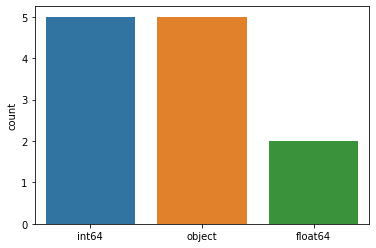

In [20]:
sns.countplot(train.dtypes.map(str))
plt.show()

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


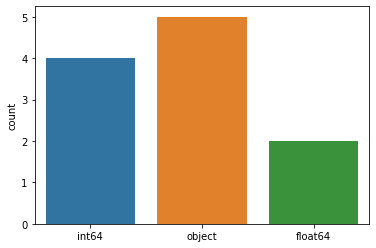

In [21]:
sns.countplot(test.dtypes.map(str))
plt.show()

In [22]:
train.dtypes.value_counts()

int64      5
object     5
float64    2
dtype: int64

In [23]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          891 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        891 non-null    object 
 11  Embarked     891 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


**Unique Values**

In [24]:
for i in train.columns:
    print('colum_name',i)
    print('unique',train[i].unique())
    print('\n')

colum_name PassengerId
unique [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180
 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198
 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216
 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234
 235 236 237 238 239 

In [25]:
train["Cabin"].unique()

array(['B96 B98', 'C85', 'C123', 'E46', 'G6', 'C103', 'D56', 'A6',
       'C23 C25 C27', 'B78', 'D33', 'B30', 'C52', 'B28', 'C83', 'F33',
       'F G73', 'E31', 'A5', 'D10 D12', 'D26', 'C110', 'B58 B60', 'E101',
       'F E69', 'D47', 'B86', 'F2', 'C2', 'E33', 'B19', 'A7', 'C49', 'F4',
       'A32', 'B4', 'B80', 'A31', 'D36', 'D15', 'C93', 'C78', 'D35',
       'C87', 'B77', 'E67', 'B94', 'C125', 'C99', 'C118', 'D7', 'A19',
       'B49', 'D', 'C22 C26', 'C106', 'C65', 'E36', 'C54',
       'B57 B59 B63 B66', 'C7', 'E34', 'C32', 'B18', 'C124', 'C91', 'E40',
       'T', 'C128', 'D37', 'B35', 'E50', 'C82', 'E10', 'E44', 'A34',
       'C104', 'C111', 'C92', 'E38', 'D21', 'E12', 'E63', 'A14', 'B37',
       'C30', 'D20', 'B79', 'E25', 'D46', 'B73', 'C95', 'B38', 'B39',
       'B22', 'C86', 'C70', 'A16', 'C101', 'C68', 'A10', 'E68', 'B41',
       'A20', 'D19', 'D50', 'D9', 'A23', 'B50', 'A26', 'D48', 'E58',
       'C126', 'B71', 'B51 B53 B55', 'D49', 'B5', 'B20', 'F G63',
       'C62 C64', 'E24

**Comparision with survived**<a id="com"></a>

In [26]:
train[['Pclass', 'Survived']].groupby(['Pclass'], as_index=False).mean().sort_values(by='Survived', ascending=False)

,Pclass,Survived
0,1,0.629630
1,2,0.472826
2,3,0.242363


In [27]:
train[["Sex", "Survived"]].groupby(['Sex'], as_index=False).mean().sort_values(by='Survived', ascending=False)

,Sex,Survived
0,female,0.742038
1,male,0.188908


In [28]:
train[["SibSp", "Survived"]].groupby(['SibSp'], as_index=False).mean().sort_values(by='Survived', ascending=False)

,SibSp,Survived
1,1,0.535885
2,2,0.464286
0,0,0.345395
3,3,0.250000
4,4,0.166667
5,5,0.000000
6,8,0.000000


In [29]:
train[["Parch", "Survived"]].groupby(['Parch'], as_index=False).mean().sort_values(by='Survived', ascending=False)

,Parch,Survived
3,3,0.600000
1,1,0.550847
2,2,0.500000
0,0,0.343658
5,5,0.200000
4,4,0.000000
6,6,0.000000


<div style="border-radius:10px;
            border : black solid;
            background-color:  #FFA07A;
            font-size:110%;
            text-align: left">
    <h2 style='; border:0; border-radius: 15px; text-shadow: 1px 1px black; font-weight: bold; color:black'><center> Data Visualization </center></h2><a id="vis"></a>



![](https://cdn4.vectorstock.com/i/1000x1000/10/63/machine-learning-algorithm-big-data-visualization-vector-24231063.jpg)

**Distribution of age**<a id="age"></a>

1. **Histogram**

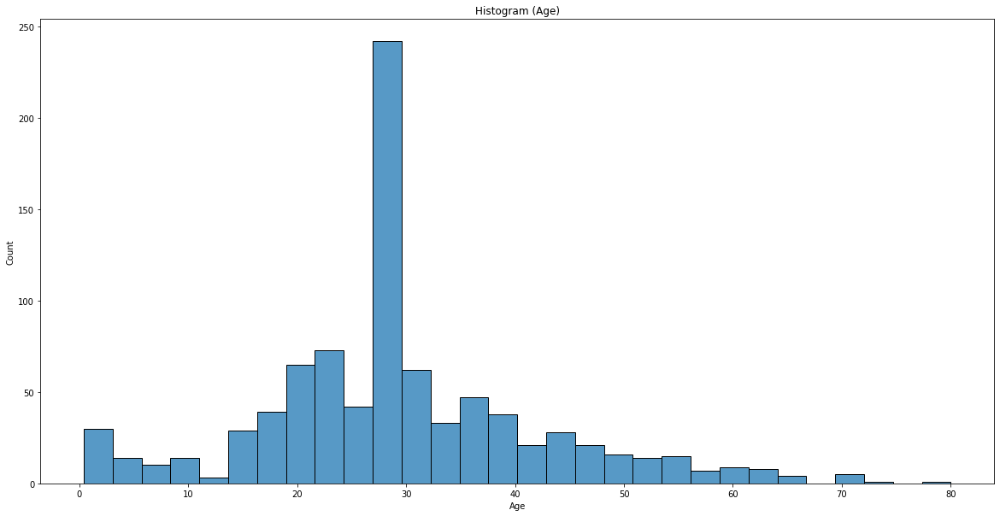

In [30]:
plt.figure(figsize = (20,10))
sns.histplot(x = "Age", data = train)
plt.title("Histogram (Age)")
plt.show()

2. **KDE**

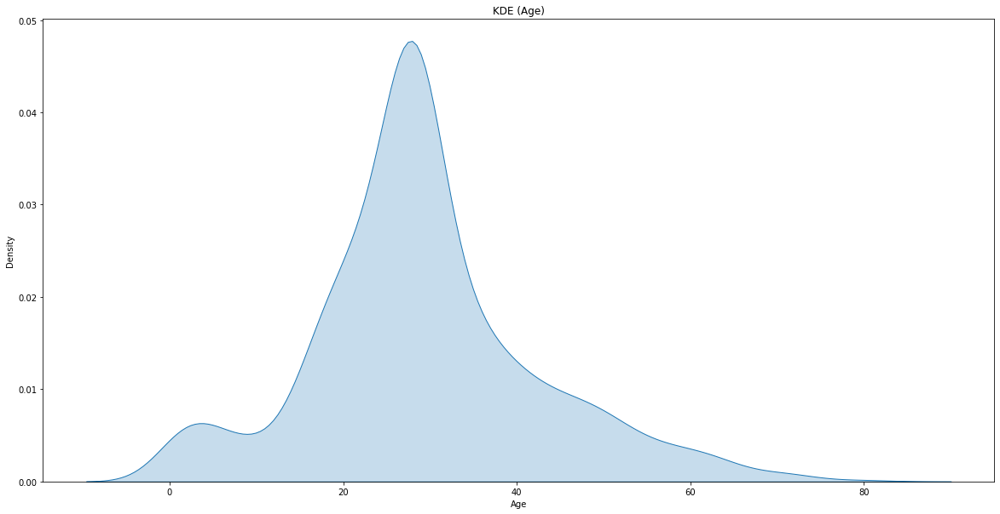

In [31]:
plt.figure(figsize = (20,10))
sns.kdeplot(x = "Age", data = train, fill = True)
plt.title("KDE (Age)")
plt.show()

3.**Boxplot** 

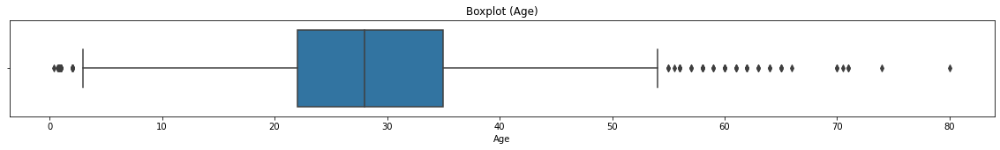

In [32]:
plt.figure(figsize = (20,2))
sns.boxplot(x = "Age", data = train)
plt.title("Boxplot (Age)")
plt.show()

4.**Violin plot** 

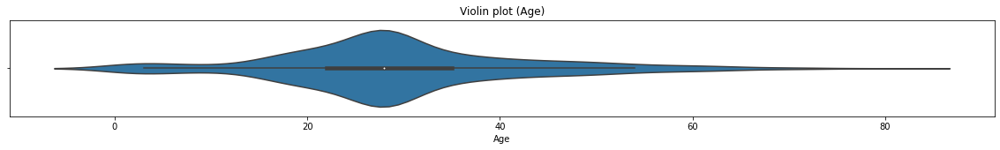

In [33]:
plt.figure(figsize = (20,2))
sns.violinplot(x = "Age", data = train)
plt.title("Violin plot (Age)")
plt.show()

**Distribution of fare**<a id="fare"></a>

1. **Histogram**

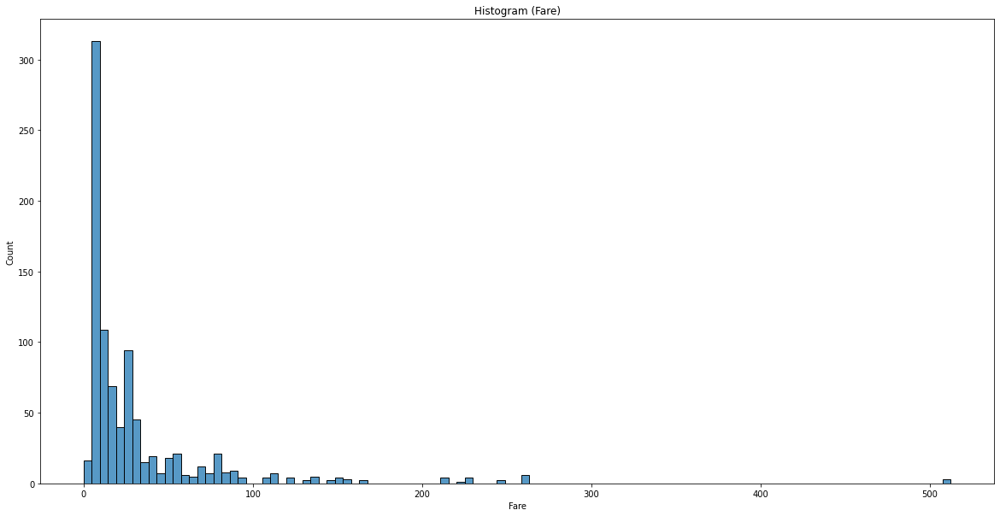

In [34]:
plt.figure(figsize = (20,10))
sns.histplot(x = "Fare", data = train)
plt.title("Histogram (Fare)")
plt.show()

2.**KDE** 

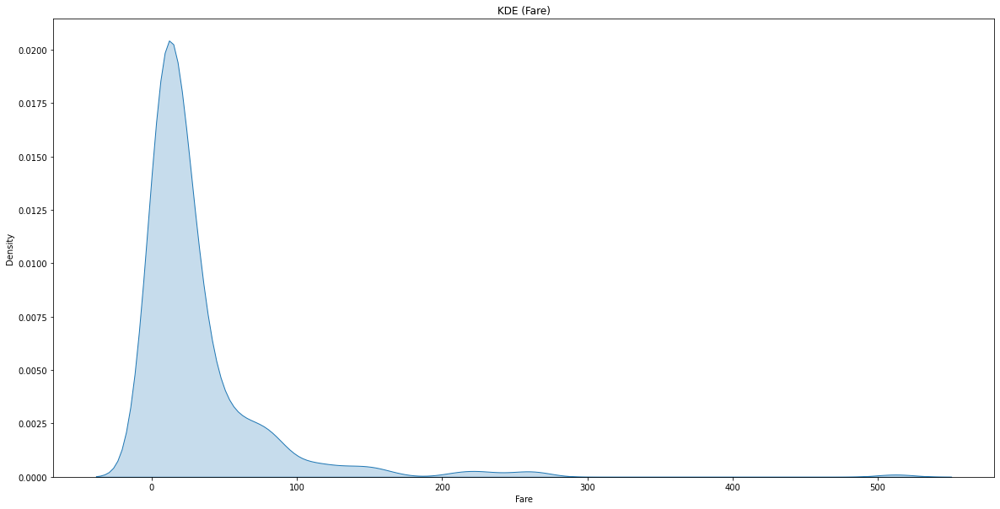

In [35]:
plt.figure(figsize = (20,10))
sns.kdeplot(x = "Fare", data = train, fill = True)
plt.title("KDE (Fare)")
plt.show()

3. **Boxplot**

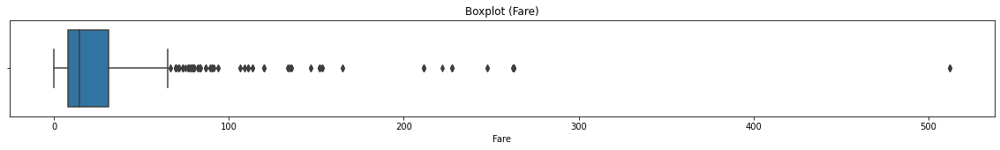

In [36]:
plt.figure(figsize = (20,2))
sns.boxplot(x = "Fare", data = train)
plt.title("Boxplot (Fare)")
plt.show()

4.**Violin plot** 

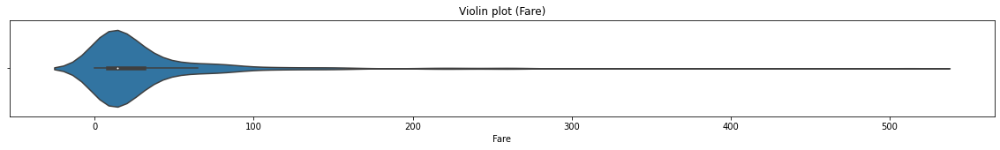

In [37]:
plt.figure(figsize = (20,2))
sns.violinplot(x = "Fare", data = train)
plt.title("Violin plot (Fare)")
plt.show()

**Distribution of gender**<a id="gender"></a>

1. **Countplot**

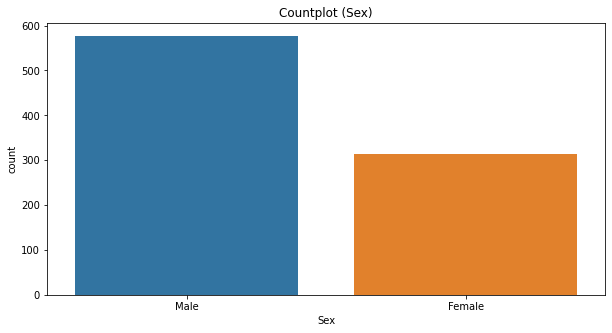

In [38]:
plt.figure(figsize = (10, 5))
sns.countplot(x = "Sex", data = train)
plt.title("Countplot (Sex)")
plt.xticks([0, 1], ["Male", "Female"])
plt.show()

**Relation of various features with Survived**<a id="rel"></a>

1. **Relation between Survived and Pclass**

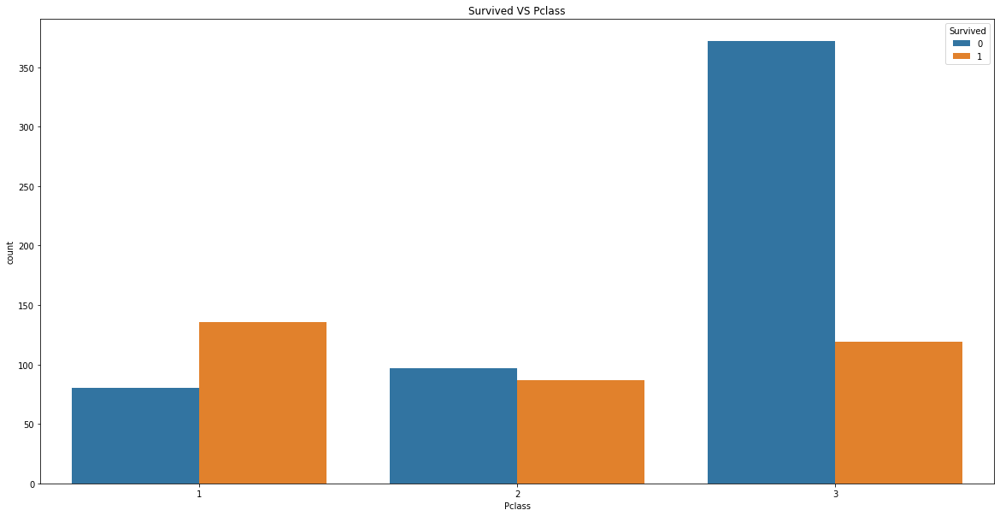

In [39]:
plt.figure(figsize = (20, 10))
sns.countplot(x = "Pclass", hue = "Survived", data = train)
plt.title("Survived VS Pclass")
plt.show()

2.**Relation between Survived and SibSp** 

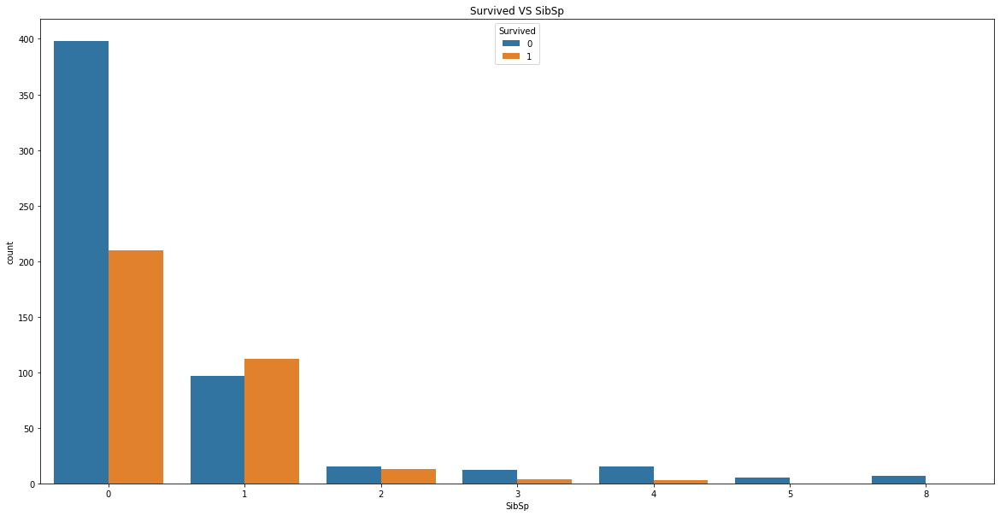

In [40]:
plt.figure(figsize = (20, 10))
sns.countplot(x = "SibSp", hue = "Survived", data = train)
plt.title("Survived VS SibSp")
plt.show()

3.**Realation between Survived amd Age** 

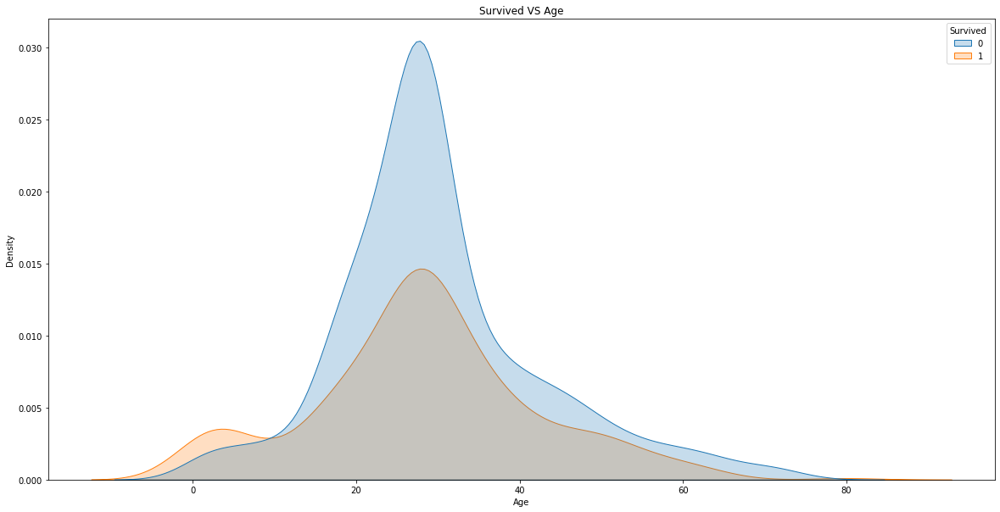

In [41]:
plt.figure(figsize = (20, 10))
sns.kdeplot(x = "Age", hue = "Survived", data = train, shade = True)
plt.title("Survived VS Age")
plt.show()

4.**Realation between Survived and Fare** 

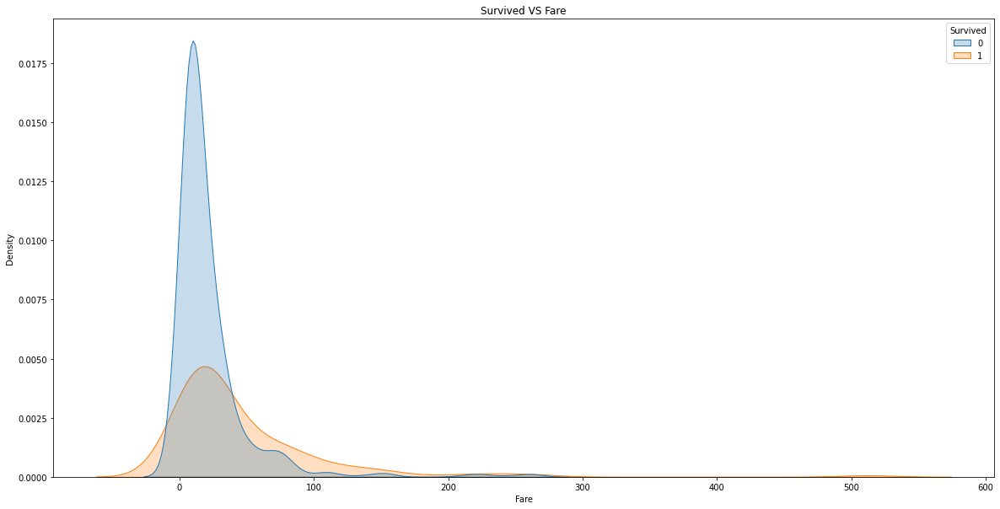

In [42]:
plt.figure(figsize = (20, 10))
sns.kdeplot(x = "Fare", hue = "Survived", data = train, shade = True)
plt.title("Survived VS Fare")
plt.show()

 **Relation of various features with Age and Survived**

<AxesSubplot:xlabel='Cabin', ylabel='Age'>

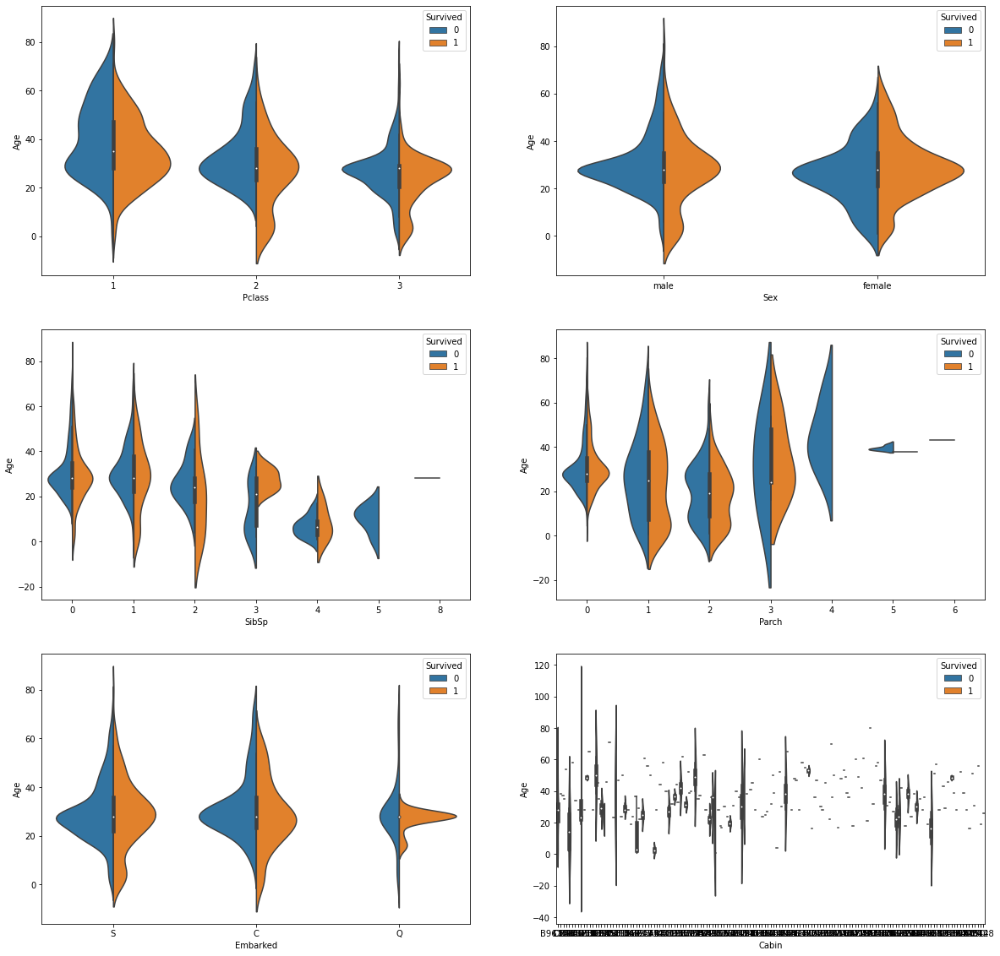

In [43]:
fig, axes = plt.subplots(3, 2, figsize = (20, 20))

sns.violinplot(x = "Pclass", y = "Age", hue = "Survived", split = True, data = train, ax = axes[0, 0])
sns.violinplot(x = "Sex", y = "Age", hue = "Survived", split = True, data = train, ax = axes[0, 1])
sns.violinplot(x = "SibSp", y = "Age", hue = "Survived", split = True, data = train, ax = axes[1, 0])
sns.violinplot(x = "Parch", y = "Age", hue = "Survived", split = True, data = train, ax = axes[1, 1])
sns.violinplot(x = "Embarked", y = "Age", hue = "Survived", split = True, data = train, ax = axes[2, 0])
sns.violinplot(x = "Cabin", y = "Age", hue = "Survived", split = True, data = train, ax = axes[2, 1])

**Barplot**

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


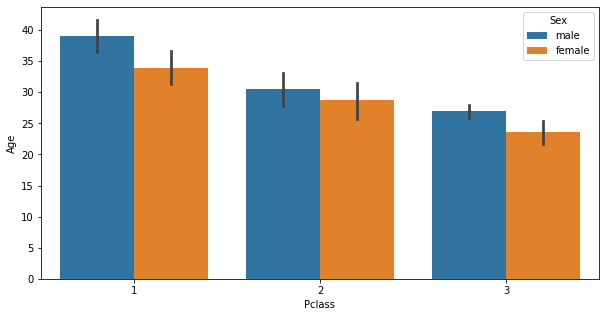

In [44]:
plt.figure(figsize = (10, 5))
sns.barplot(train['Pclass'],train['Age'],hue=train['Sex'])
plt.show()

**HEATMAP**

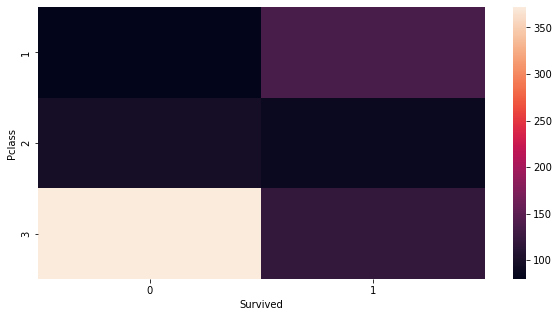

In [45]:
plt.figure(figsize = (10, 5))
sns.heatmap(pd.crosstab(train['Pclass'],train['Survived']))
plt.show()

<div style="border-radius:10px;
            border : black solid;
            background-color:  #FFA07A;
            font-size:110%;
            text-align: left">
    <h2 style='; border:0; border-radius: 15px; text-shadow: 1px 1px black; font-weight: bold; color:black'><center> Auto Visualization </center></h2><a id="auto"></a>




![](https://images.idgesg.net/images/article/2018/02/big_data_analytics_analysis_thinkstock_673266772-100749739-large.jpg?auto=webp&quality=85,70)

In [46]:
!pip install autoviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 476.1 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.9/12.9 MB 23.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.5/96.5 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 46.5 MB/s eta 0:00:00
  Attempting uninstall: panel
    Found existing installation: panel 0.13.1
    Uninstalling panel-0.13.1:
      Successfully uninstalled panel-0.13.1


Alert! from version 0.1.41, after importing, you must do '%matplotlib inline' to display charts in Jupyter Notebooks.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not display plots but saves them in AutoViz_Plots folder in local machine.
Updated: chart_format='bokeh' generates and displays charts in your local Jupyter notebook.
      chart_format='server' generates and displays charts in the browser - one tab for each chart.
      chart_format='html' silently saves charts HTML format - they are also interactive!


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
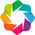

Shape of your Data Set loaded: (891, 12)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    12 Predictors classified...
        1 variables removed since they were ID or low-information variables
Number of All Scatter Plots = 3
Could not draw wordcloud plot for Name
Could not draw wordcloud plot for Ticket
Could not draw wordcloud plot for Cabin
Time to run AutoViz = 1 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


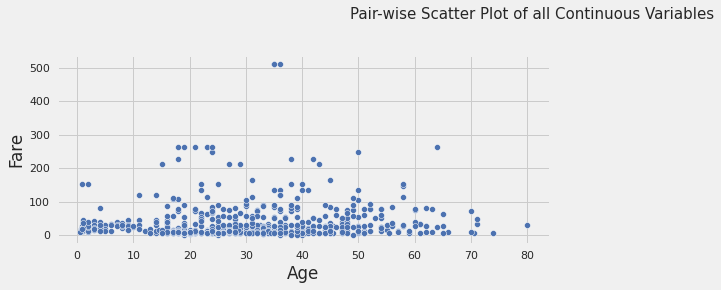

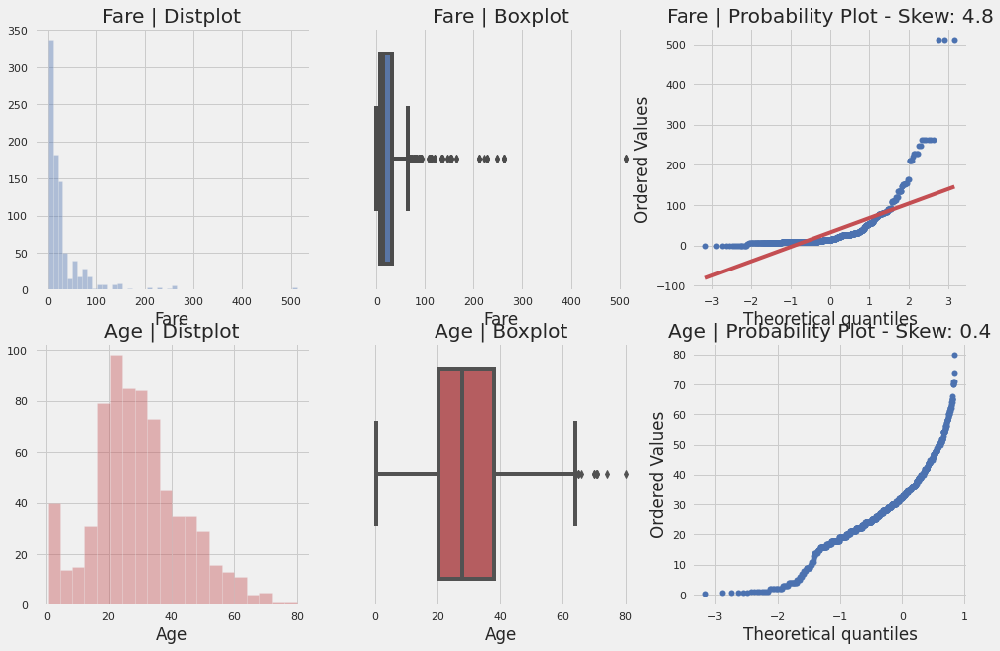

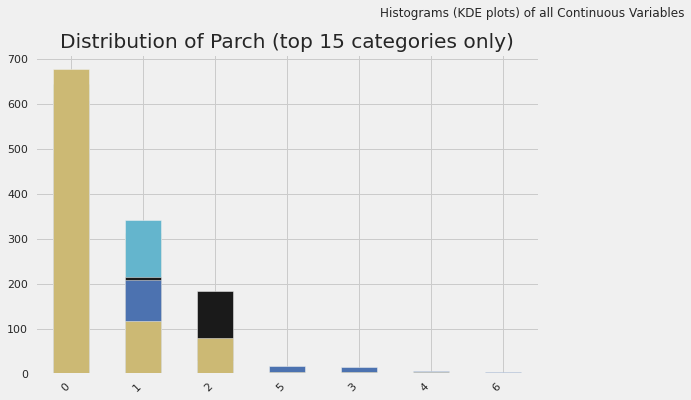

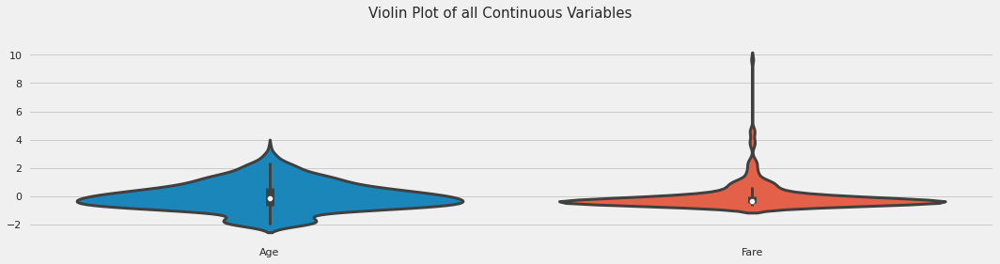

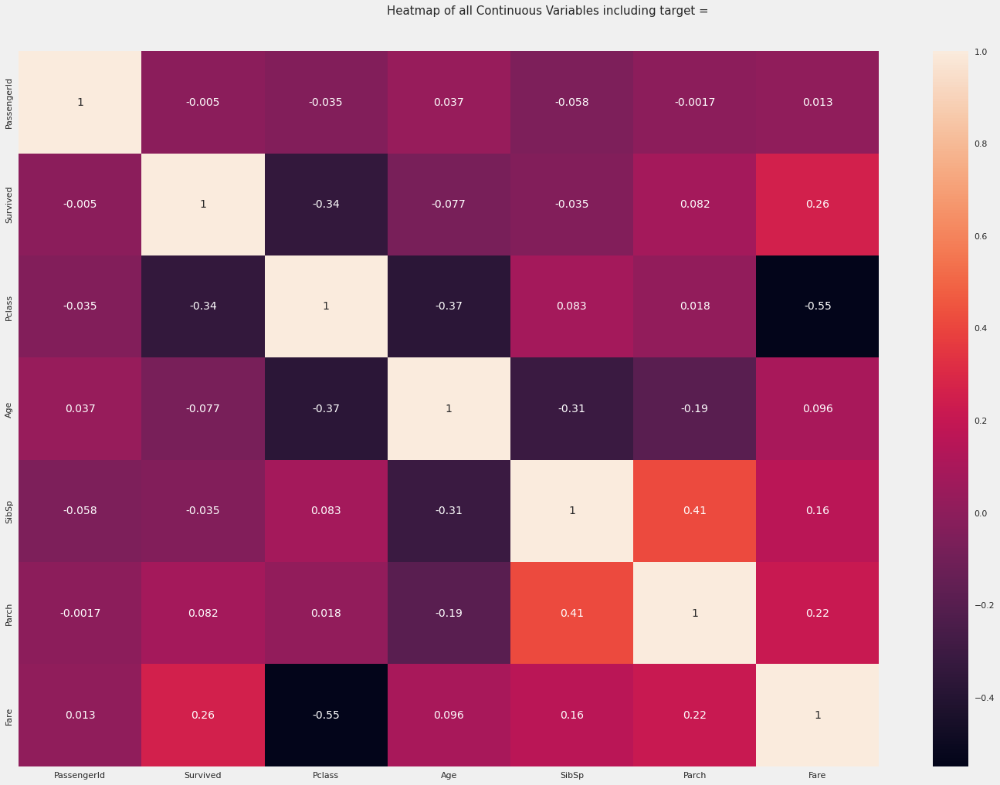

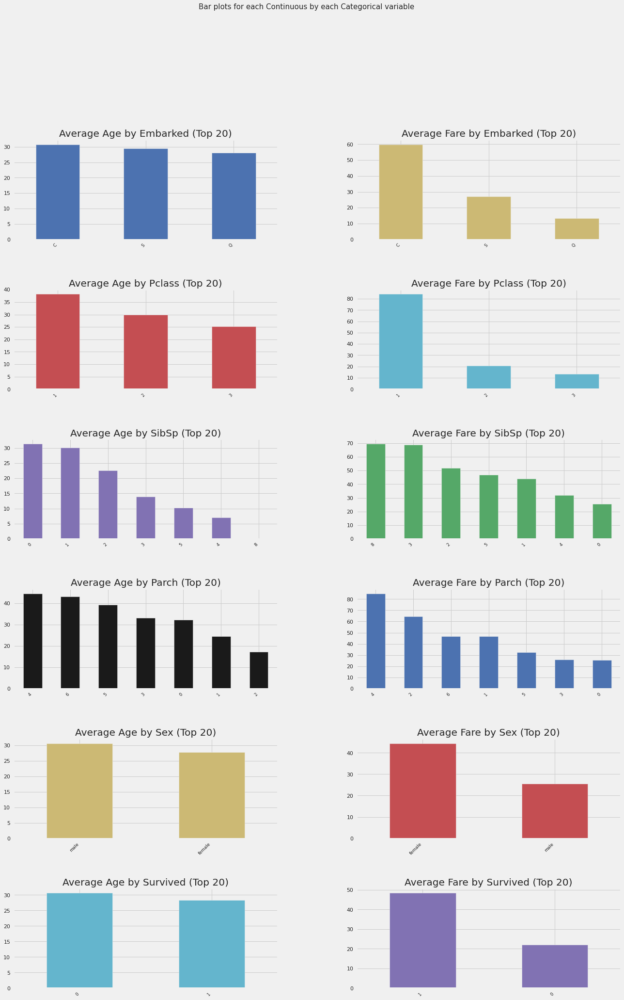

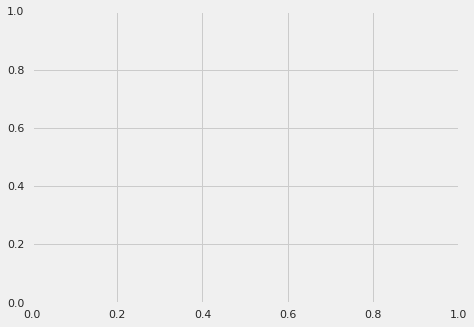

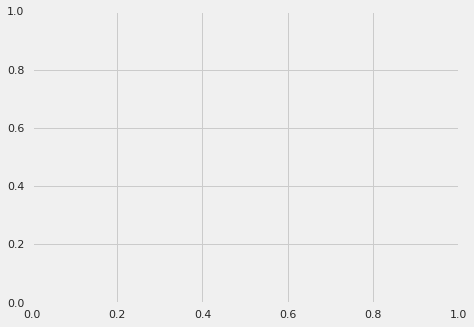

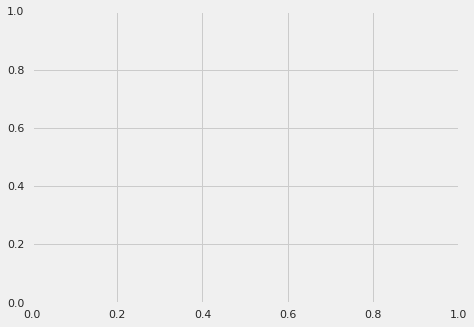

In [47]:
plt.figure(figsize = (10, 5))
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
df_av = AV.AutoViz('../input/titanic/train.csv')
plt.show()

**Data pre-processing** <a id="pro"></a>

In [48]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for col in train.columns:
    if train[col].dtypes == 'object':
        train[col] = le.fit_transform(train[col])

In [49]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for col in test.columns:
    if test[col].dtypes == 'object':
        test[col] = le.fit_transform(test[col])

In [50]:
train.corr()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
PassengerId,1.000000,-0.005007,-0.035144,-0.038559,0.042939,0.034212,-0.057527,-0.001652,-0.056554,0.012658,-0.018086,0.013128
Survived,-0.005007,1.000000,-0.338481,-0.057343,-0.543351,-0.064910,-0.035322,0.081629,-0.164549,0.257307,0.175690,-0.167675
Pclass,-0.035144,-0.338481,1.000000,0.052831,0.131900,-0.339898,0.083081,0.018443,0.319869,-0.549500,-0.248495,0.162098
Name,-0.038559,-0.057343,0.052831,1.000000,0.020314,0.048252,-0.017230,-0.049105,0.047348,-0.049173,0.034129,-0.006117
Sex,0.042939,-0.543351,0.131900,0.020314,1.000000,0.081163,-0.114631,-0.245489,0.059372,-0.182333,-0.102643,0.108262
Age,0.034212,-0.064910,-0.339898,0.048252,0.081163,1.000000,-0.233296,-0.172482,-0.070382,0.096688,0.060534,-0.018754
SibSp,-0.057527,-0.035322,0.083081,-0.017230,-0.114631,-0.233296,1.000000,0.414838,0.079461,0.159651,-0.005539,0.068230
Parch,-0.001652,0.081629,0.018443,-0.049105,-0.245489,-0.172482,0.414838,1.000000,0.020003,0.216225,0.022682,0.039798
Ticket,-0.056554,-0.164549,0.319869,0.047348,0.059372,-0.070382,0.079461,0.020003,1.000000,-0.013885,-0.072200,-0.001729
Fare,0.012658,0.257307,-0.549500,-0.049173,-0.182333,0.096688,0.159651,0.216225,-0.013885,1.000000,0.090516,-0.224719


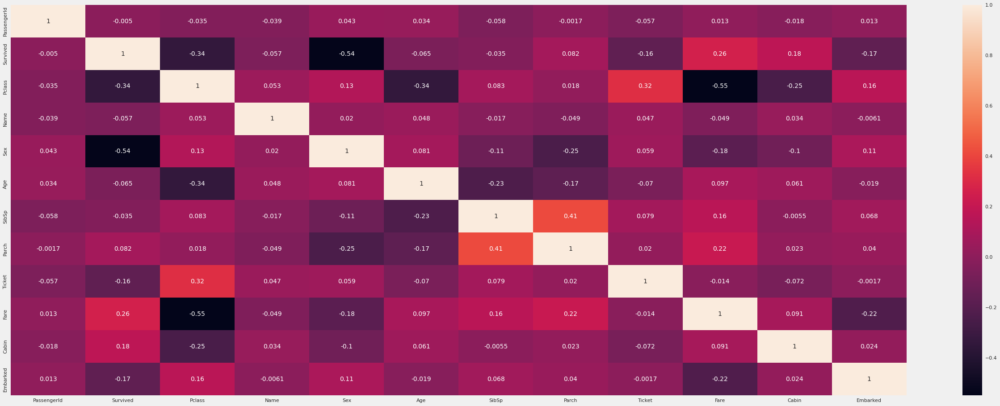

In [51]:
plt.figure(figsize=(40,15))
a=sns.heatmap(train.corr(),annot=True)

In [52]:
X=train.drop(['Survived'], axis=1)
y=train['Survived']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 1)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((712, 11), (179, 11), (712,), (179,))

<div style="border-radius:10px;
            border : black solid;
            background-color:  #FFA07A;
            font-size:110%;
            text-align: left">
    <h2 style='; border:0; border-radius: 15px; text-shadow: 1px 1px black; font-weight: bold; color:black'><center> Model Creation and Evalutation </center></h2><a id="model"></a>



![](https://miro.medium.com/max/1400/0*yni8--v-iw517vnQ.jpg)

**Decision tree classifier**<a id="dtc"></a>

It is a tree-structured classifier, where internal nodes represent the features of a dataset, branches represent the decision rules and each leaf node represents the outcome. In a Decision tree, there are two nodes, which are the Decision Node and Leaf Node. There are generally two types of decision trees. Models where the target variable can take a finite set of values are called classification trees. Trees where the target variable can take continuous values (typically real numbers) are called regression trees.
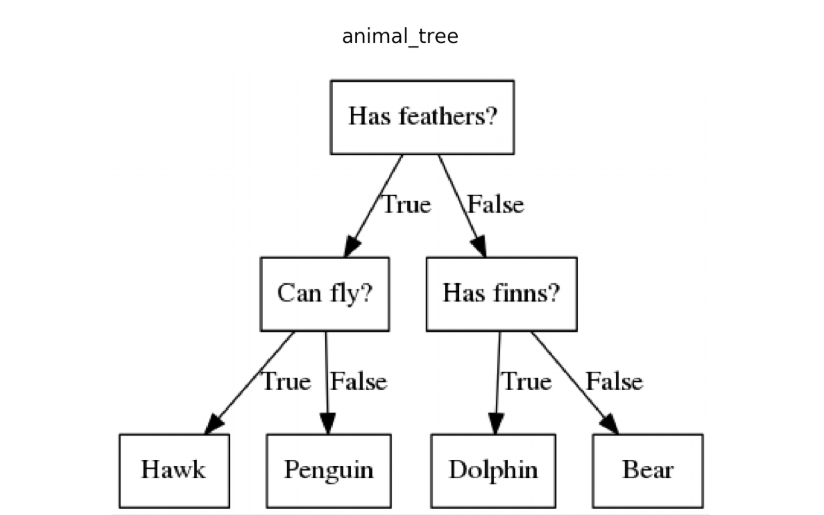
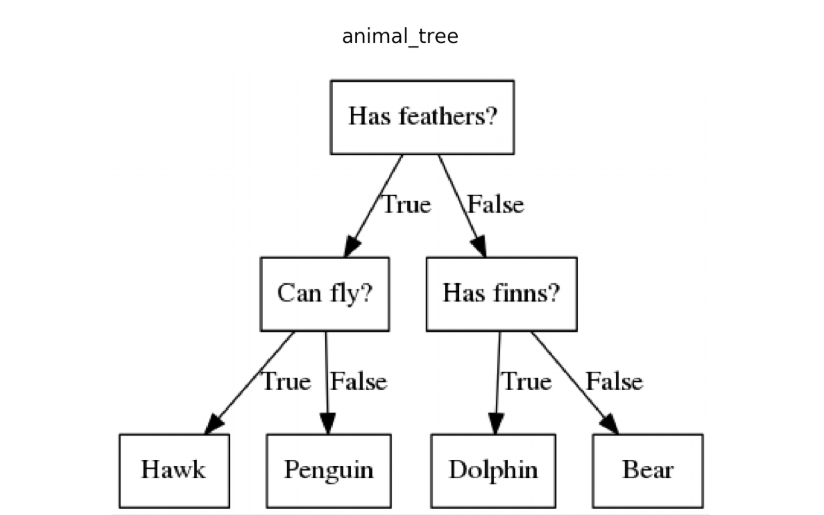


In [53]:
decision_tree_model = DecisionTreeClassifier(random_state = 2)
decision_tree_model.fit(X_train, y_train)
y_pred = decision_tree_model.predict(X_test)
decision_tree_model_acc = accuracy_score(y_pred, y_test) * 100
print("Accuracy:", decision_tree_model_acc)

Accuracy: 76.53631284916202


**Random forest classifier**<a id="rfc"></a>




The random forest classifier is an improvement over decision tree classifiers. Based on ensemble learning, a random forest classifier contains a number of decision trees on various subsets of the given dataset and takes the average to improve the predictive accuracy of that dataset. In general, a greater number of trees in the forest leads to higher accuracy and prevents the problem of overfitting.
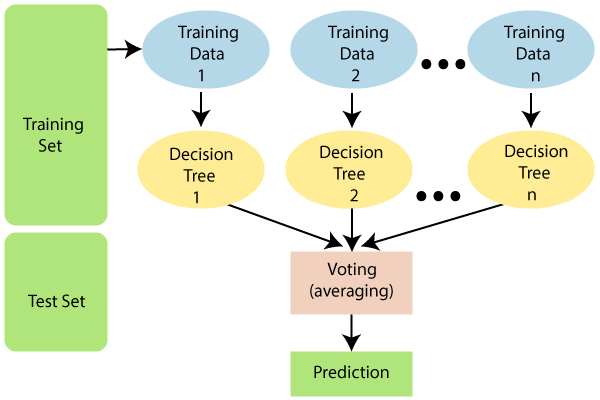

In [54]:
random_forest_model = RandomForestClassifier(criterion='gini',
                                            n_estimators=1750,
                                            max_depth=7,
                                            min_samples_split=6,
                                            min_samples_leaf=6,
                                            max_features='auto',
                                            verbose=1,
                                            random_state = 3)
random_forest_model.fit(X_train, y_train)
y_pred = random_forest_model.predict(X_test)
random_forest_model_acc = accuracy_score(y_pred, y_test) * 100
print("Accuracy:", random_forest_model_acc)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1750 out of 1750 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Accuracy: 78.77094972067039


[Parallel(n_jobs=1)]: Done 1750 out of 1750 | elapsed:    0.2s finished


**Naive Bayes classifier**<a id="nbc"></a>



The Naïve Bayes classifier is a probabilistic classifier that uses Bayes theorem. It assumes complete independance between the features.
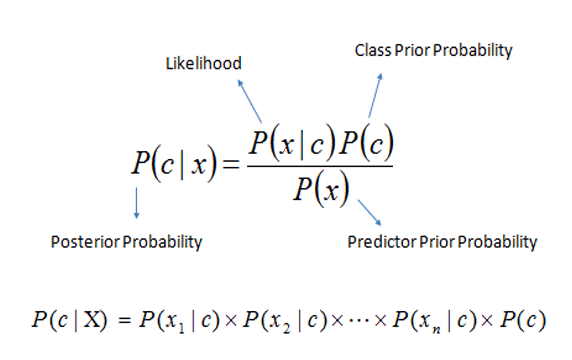

In [55]:
NB_model = GaussianNB()
NB_model.fit(X_train, y_train)
y_pred = NB_model.predict(X_test)
NB_model_acc = accuracy_score(y_pred, y_test) * 100
print("Accuracy:", NB_model_acc)

Accuracy: 70.39106145251397


**K-nearest neighbours classifier**<a id="knn"></a>




The K-nearest neighbours (KNN) classifier uses proximity to make classifications or predictions about independent data points. This technique may be used for both classification and regression scenarios and the output will vary. In classification instances, a decision is made based on majority vote, i.e., the class assigned to the new data point is taken to be the one that is most frequently seen in the vicinity of the point. KNN is also known as a lazy learner technique since a model is not learned. Instead, the raw data is stored and used everytime a prediction must be made.
![](https://analyticsjobs.in/wp-content/uploads/2020/02/Calculate-the-Euclidean-distance-between-the-data-points.jpg)


In [56]:
knn_model = KNeighborsClassifier(n_neighbors = 5)
knn_model.fit(X_train, y_train)
y_pred = knn_model.predict(X_test)
knn_model_acc = accuracy_score(y_pred, y_test) * 100
print("Accuracy:", knn_model_acc)

Accuracy: 64.24581005586593


**Support vector machines**<a id="svm"></a>



Support vector machines (SVM) are a class of machine learning algorithms that map data to a high dimensionality feature space in such a manner that the data points can be categorized, even when they are not otherwise linearly seperable. A seperator between the categories is found and a hyperplane is drawn accordingly. Support vectors are those data points that are close to the hyperplane and influence the position and orientation of the hyperplane. The function used to map data to a high dimensionality feature space is called a kernel function.
![](https://www.analyticssteps.com/backend/media/thumbnail/338466/8680904_1588569086_SVM.jpg)


In [57]:
svm_model = SVC()
svm_model.fit(X_train, y_train)
y_pred = svm_model.predict(X_test)
svm_model_acc = accuracy_score(y_pred, y_test) * 100
print("Accuracy:", svm_model_acc)

Accuracy: 67.59776536312849


<div style="border-radius:10px;
            border : black solid;
            background-color:  #FFA07A;
            font-size:110%;
            text-align: left">
    <h2 style='; border:0; border-radius: 15px; text-shadow: 1px 1px black; font-weight: bold; color:black'><center>Submission file </center></h2><a id="sv"></a>



![](https://ncats.nih.gov/files/AI_banner_1100x420.png)

In [58]:
all_models = pd.DataFrame({
    "Model" : ["Decision tree classifier", "Random forest classifier", "Naive Bayes classifier", "KNN", "SVM"],
    "Accuracy score" : [decision_tree_model_acc, random_forest_model_acc, NB_model_acc, knn_model_acc, svm_model_acc]
})
all_models.sort_values(by = "Accuracy score")

,Model,Accuracy score
3,KNN,64.245810
4,SVM,67.597765
2,Naive Bayes classifier,70.391061
0,Decision tree classifier,76.536313
1,Random forest classifier,78.770950


In [59]:
random_forest_model = RandomForestClassifier(criterion='gini',
                                            n_estimators=1750,
                                            max_depth=7,
                                            min_samples_split=6,
                                            min_samples_leaf=6,
                                            max_features='auto',
                                            verbose=1,
                                            random_state = 3)
random_forest_model.fit(X, y)
y_pred = random_forest_model.predict(test)
print("Accuracy:", random_forest_model_acc)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1750 out of 1750 | elapsed:    2.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Accuracy: 78.77094972067039


[Parallel(n_jobs=1)]: Done 1750 out of 1750 | elapsed:    0.3s finished


In [60]:
submission = pd.DataFrame({
    "PassengerId" : test["PassengerId"],
    "Survived" : y_pred
})
submission.head(10)

,PassengerId,Survived
0,892,0
1,893,0
2,894,0
3,895,0
4,896,1
5,897,0
6,898,1
7,899,1
8,900,1
9,901,0


In [61]:
submission.to_csv('submission.csv', index = False)

<div style="border-radius:10px;
            border : black solid;
            background-color: #DA70D6;
            font-size:200%;
            text-align: left">

<h1 style='; border:0; border-radius: 10px; text-shadow: 1px 1px black; font-weight: bold; color:black'><center> YOUR FEEDBACKS IS SO VALUABLE FOR ME </center></h1>

![](https://st2.depositphotos.com/1006899/7664/i/600/depositphotos_76643019-stock-photo-thank-you-words.jpg)